In [2]:
import h5py
import healpy as hp
import numpy as np
import matplotlib.pyplot as plt

## Loading functions

In [3]:
probe_tags= {'kg': 'weak lensing', 'dg': 'galaxy clustering', 'ia': 'intrinsic alignment'}

In [4]:
def smooth(m, sig_arcmin=8, nest=False):
    if sig_arcmin>0:
        m = hp.smoothing(m, sigma=np.deg2rad(sig_arcmin/60), nest=nest)    
    return m

In [9]:
def load_projected_maps(dirname, tag='nobaryons', sig_smooth_arcmin=5, verb=False):

    all_samples = []
    maps = {}
    with h5py.File(f'{dirname}/projected_probes_maps_{tag}512.h5', 'r') as f:
        probes = list(f.keys())
        for probe in probes:
            maps[probe] = {}
            probe_tag = probe_tags[probe]
            samples = f[probe].keys()
            all_samples.extend(samples)
            for sample in samples:
                
                if verb:
                    print(f'probe = {probe_tag:<25s}  sample = {sample:>10s}')
                
                maps[probe][sample] = smooth(np.array(f[probe][sample]), sig_arcmin=sig_smooth_arcmin)

                # hp.write_map(f'map_{probe}_{sample}.fits', maps[probe][sample], fits_IDL=False)
                    
    return maps, probes, list(set(all_samples))[::-1].sort()

In [10]:
def get_bin_map(id_zbin, perm_index, with_baryons=True, smooth_arcmin=0):
    baryon_effect = 'baryonified' if with_baryons else 'nobaryons'
    file_path = f'/home/tersenov/CosmoGridV1/stage3_forecast/fiducial/cosmo_fiducial/perm_{perm_index:04d}/projected_probes_maps_{baryon_effect}512.h5'
    with h5py.File(file_path, 'r') as f:
        kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])

    # Smoothing the kg map
    if smooth_arcmin > 0:
        kg = smooth(kg, smooth_arcmin)
            
    return kg

In [11]:
def plot_map(m, title=''):

    nx, ny = 1, 1; figsize=8; fig, ax  = plt.subplots(nx, ny, figsize=(ny * figsize * 1.25, nx * figsize), squeeze=False); axl=ax.ravel(); axc=ax[0,0];  fig.set_label(' ')
    vmin, vmax = np.percentile(m, [5, 95])
    m_ = smooth(m)
    hp.orthview(m_, cmap='plasma', bgcolor='white', hold=True, title=title, half_sky=True, min=vmin, max=vmax)


def plot_probe_map(probe, sample, maps, tag=''):

    if probe in maps.keys():
        if sample in maps[probe].keys():
            plot_map(maps[probe][sample], title=f'{tag} {probe_tags[probe]} {sample}')
        else:
            nx, ny = 1, 1; figsize=8; fig, ax  = plt.subplots(nx, ny, figsize=(ny * figsize * 1.25, nx * figsize), squeeze=False); axl=ax.ravel(); axc=ax[0,0];  fig.set_label(' ')
            axc.set(title=f'{probe_tags[probe]} {sample} map not available')
            axc.axis('off')

In [12]:
maps_dmo, probes, all_samples = load_projected_maps('/home/tersenov/CosmoGridV1/stage3_forecast/grid/cosmo_000001/perm_0000/', 'nobaryons', verb=True, sig_smooth_arcmin=1)

probe = galaxy clustering          sample = stage3_lensing1


probe = galaxy clustering          sample = stage3_lensing2
probe = galaxy clustering          sample = stage3_lensing3
probe = galaxy clustering          sample = stage3_lensing4
probe = intrinsic alignment        sample = stage3_lensing1
probe = intrinsic alignment        sample = stage3_lensing2
probe = intrinsic alignment        sample = stage3_lensing3
probe = intrinsic alignment        sample = stage3_lensing4
probe = weak lensing               sample = stage3_lensing1
probe = weak lensing               sample = stage3_lensing2
probe = weak lensing               sample = stage3_lensing3
probe = weak lensing               sample = stage3_lensing4


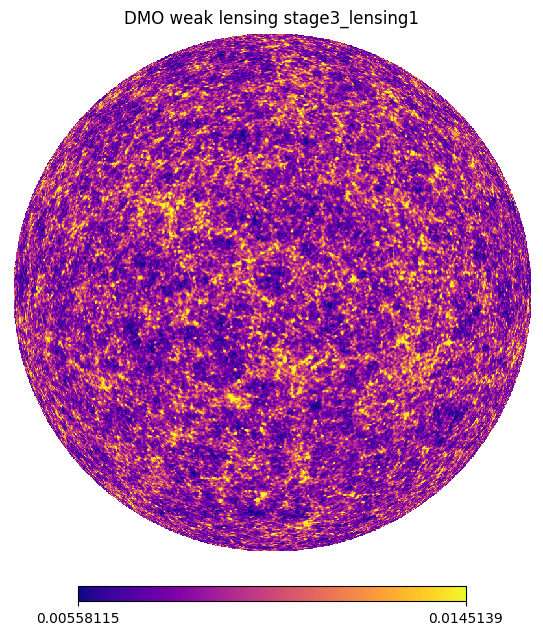

In [15]:
plot_probe_map('kg', 'stage3_lensing1', maps_dmo, tag='DMO')

## Power Spectrum

### No baryons

In [16]:
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/grid/cosmo_000002/perm_0000/projected_probes_maps_nobaryons512.h5', 'r') as f:
    kg = np.array(f['kg/stage3_lensing1'])
    dg = np.array(f['dg/stage3_lensing1'])
    ia = np.array(f['ia/stage3_lensing1'])

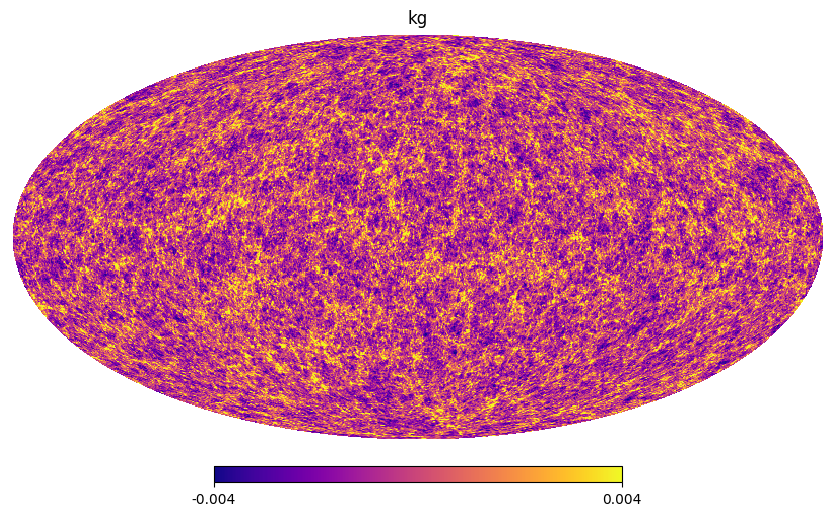

In [17]:
hp.mollview(smooth(kg) - np.mean(smooth(kg)), cmap='plasma', title='kg', min=-0.004, max=0.004)

In [18]:
def scale_cls(c):
    ells = np.arange(len(c))
    return ells, ells*(ells+1)*c/(np.pi*2)

In [19]:
cls_kg = hp.alm2cl(hp.map2alm(kg))
cls_kg_smooth = hp.alm2cl(hp.map2alm(smooth(kg)))

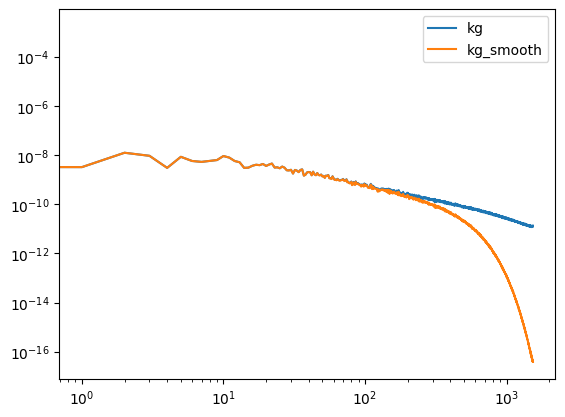

In [20]:
plt.loglog(cls_kg, label='kg')
plt.loglog(cls_kg_smooth, label='kg_smooth')
plt.legend()

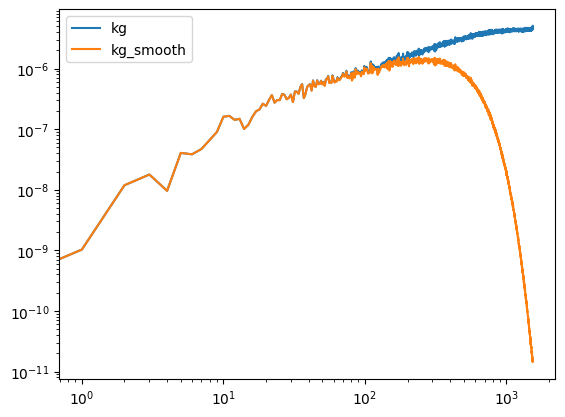

In [21]:
plt.loglog(*scale_cls(cls_kg), label='kg')
plt.loglog(*scale_cls(cls_kg_smooth), label='kg_smooth')
plt.legend()

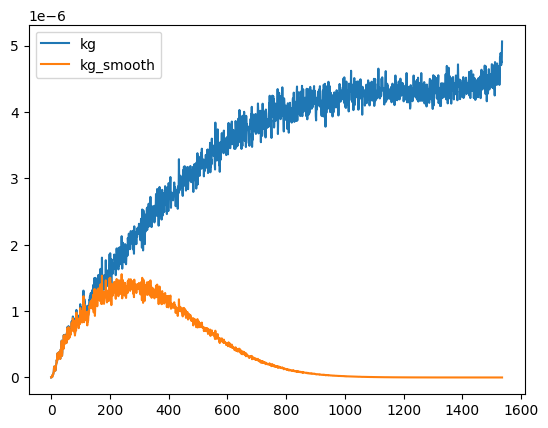

In [22]:
plt.plot(*scale_cls(cls_kg), label='kg')
plt.plot(*scale_cls(cls_kg_smooth), label='kg_smooth')
plt.legend()

BNT transform

In [23]:
M = np.array([[ 1.        ,  0.        ,  0.        ,  0.        ],
       [-1.        ,  1.        ,  0.        ,  0.        ],
       [ 0.4521097 , -1.4521097 ,  1.        ,  0.        ],
       [ 0.        ,  0.25127807, -1.251278  ,  1.        ]])

In [ ]:
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/grid/cosmo_000002/perm_0000/projected_probes_maps_nobaryons512.h5', 'r') as f:
    kg = np.array(f['kg/stage3_lensing1'])
    dg = np.array(f['dg/stage3_lensing1'])
    ia = np.array(f['ia/stage3_lensing1'])

In [25]:
# load the maps for the 4 redshift bins
maps = {}
for i in range(4):
    maps[i] = get_bin_map(i, 0, with_baryons=False, smooth_arcmin=1)

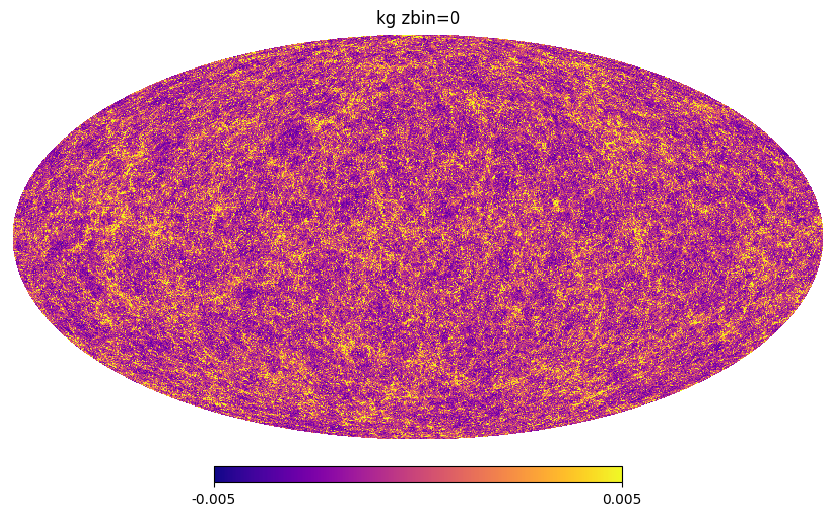

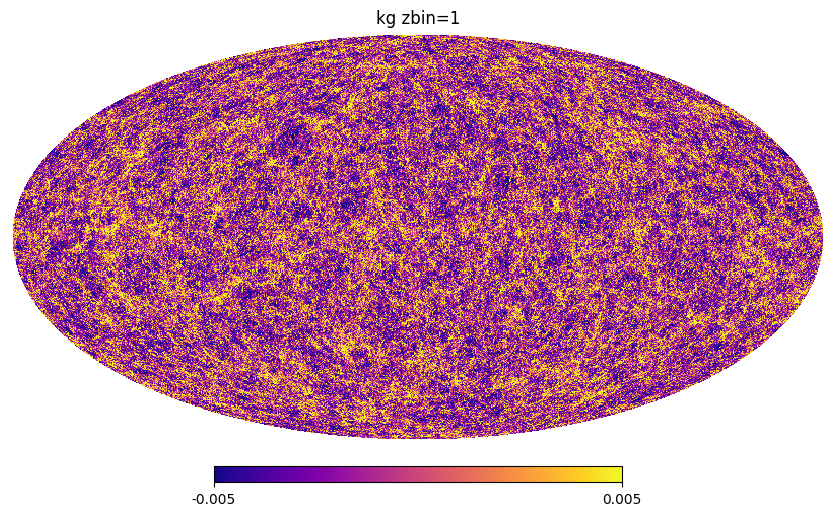

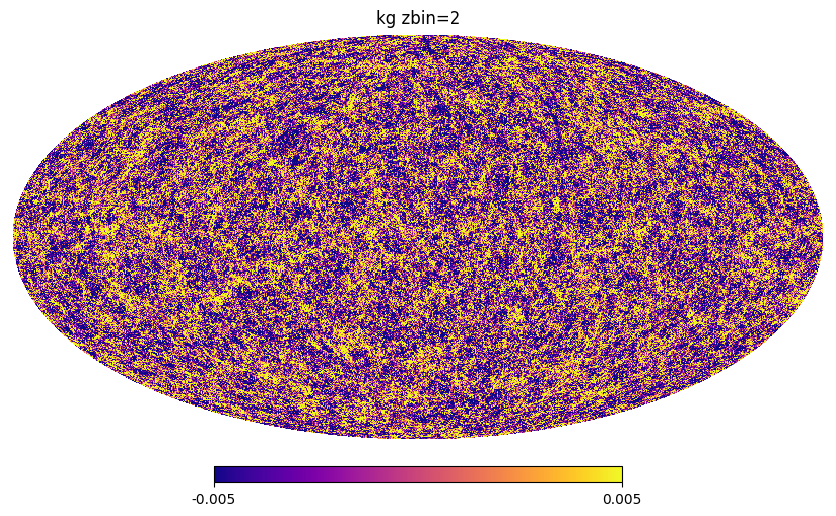

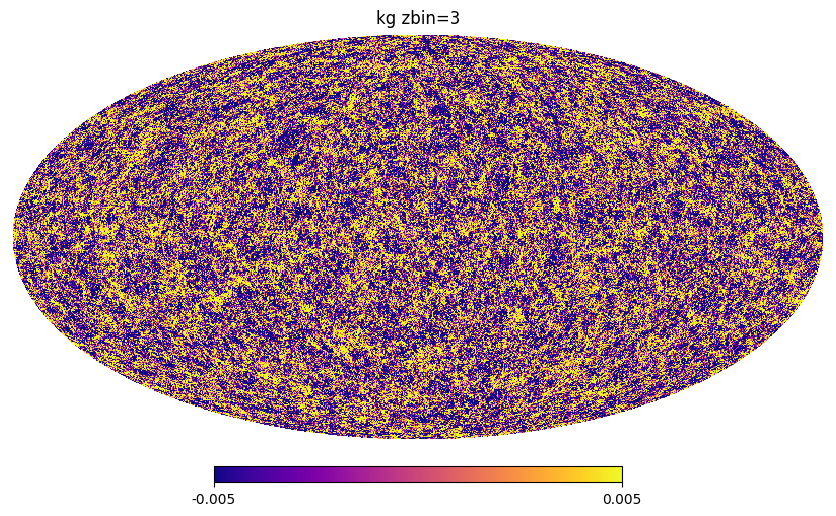

In [ ]:
for i in range(4):
    hp.mollview(maps[i] - np.mean(maps[i]), cmap='plasma', title=f'kg zbin={i}', min=-0.005, max=0.005)

In [ ]:
kappa_maps = np.stack([maps[i] for i in range(4)], axis=0)


(4, 3145728)

In [34]:
kappa_BNT = M @ kappa_maps

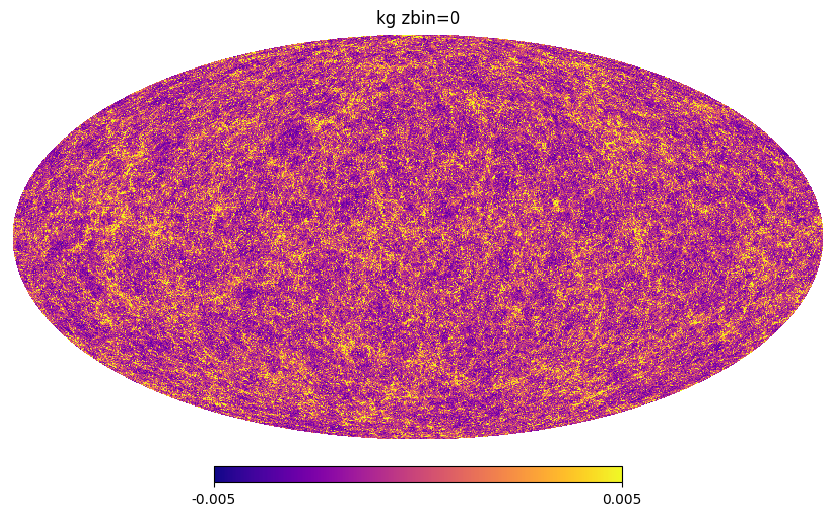

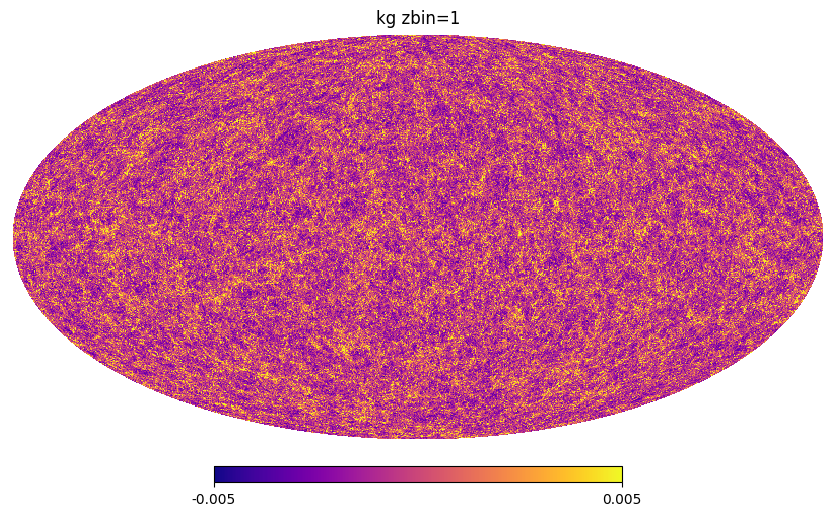

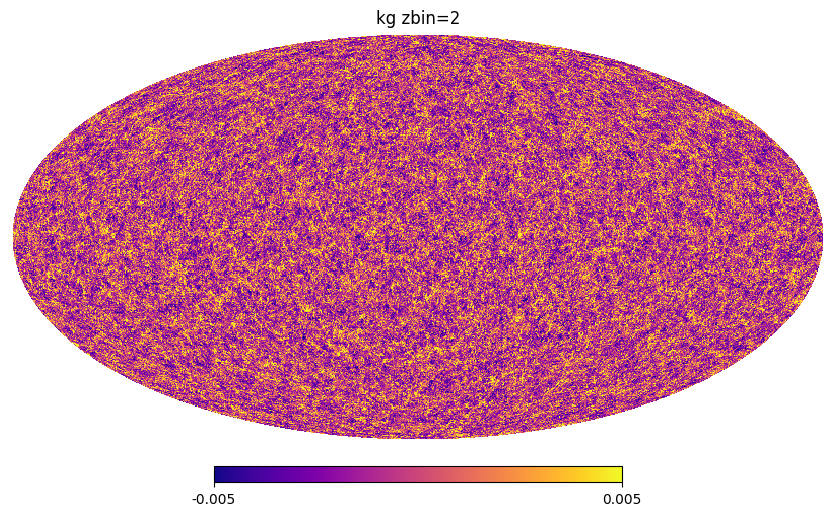

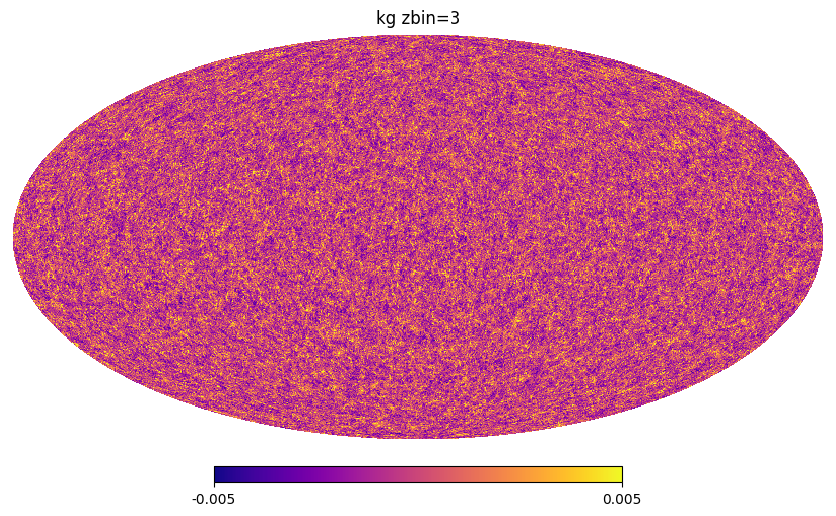

In [35]:
for i in range(4):
    hp.mollview(kappa_BNT[i] - np.mean(kappa_BNT[i]), cmap='plasma', title=f'kg zbin={i}', min=-0.005, max=0.005)

### With baryons

In [12]:
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/grid/cosmo_000002/perm_0000/projected_probes_maps_baryonified512.h5', 'r') as f:
    kg_bar = np.array(f['kg/stage3_lensing1'])
    dg_bar = np.array(f['dg/stage3_lensing1'])
    ia_bar = np.array(f['ia/stage3_lensing1'])

In [13]:
cls_kg_bar = hp.alm2cl(hp.map2alm(kg_bar))
cls_kg_bar_smooth = hp.alm2cl(hp.map2alm(smooth(kg_bar)))

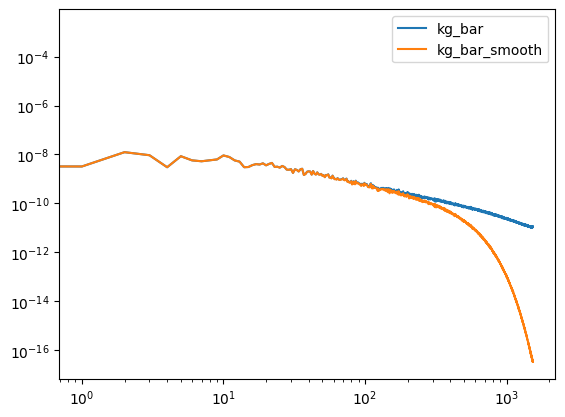

In [14]:
plt.loglog(cls_kg_bar, label='kg_bar')
plt.loglog(cls_kg_bar_smooth, label='kg_bar_smooth')
plt.legend()

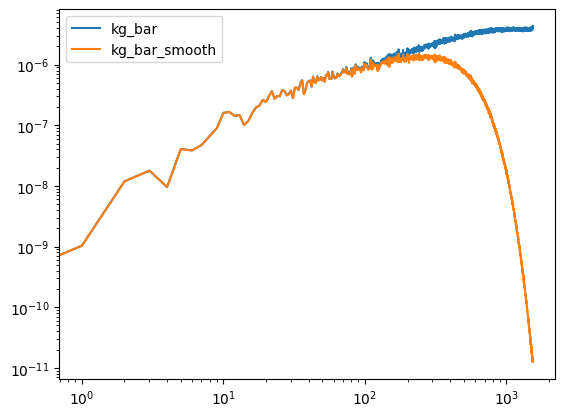

In [15]:
plt.loglog(*scale_cls(cls_kg_bar), label='kg_bar')
plt.loglog(*scale_cls(cls_kg_bar_smooth), label='kg_bar_smooth')
plt.legend()

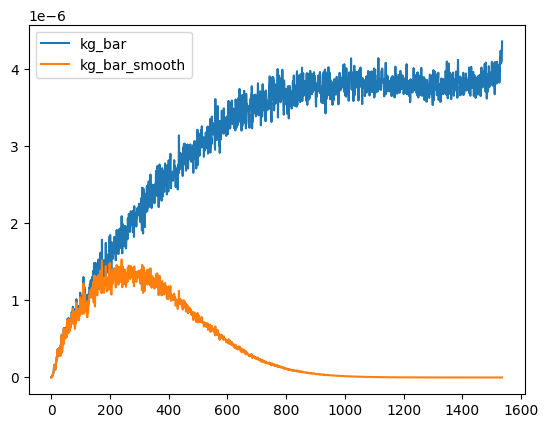

In [16]:
plt.plot(*scale_cls(cls_kg_bar), label='kg_bar')
plt.plot(*scale_cls(cls_kg_bar_smooth), label='kg_bar_smooth')
plt.legend()

### Comparison

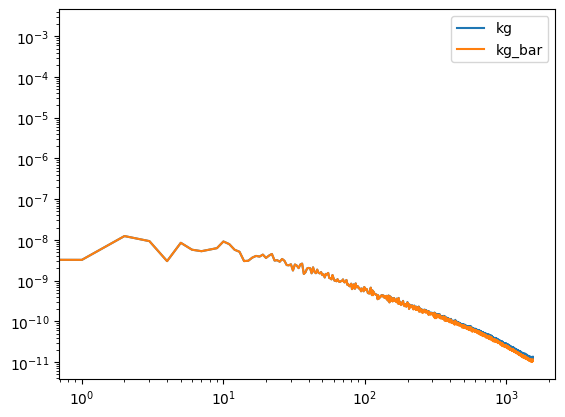

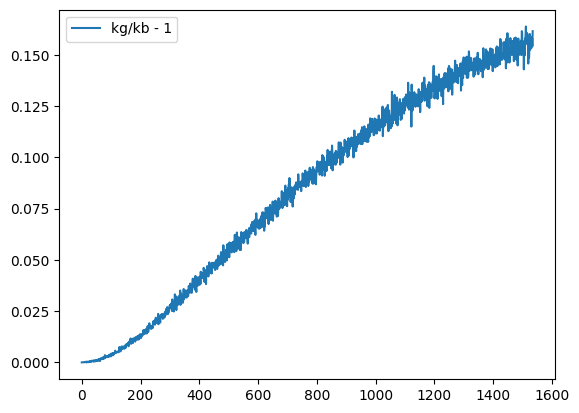

In [17]:
plt.loglog(cls_kg, label='kg')
plt.loglog(cls_kg_bar, label='kg_bar')
# plt.loglog(cls_kg_smooth, label='kg_smooth')
# plt.loglog(cls_kg_bar_smooth, label='kg_bar_smooth')
plt.legend()
plt.show()

# Plot the difference of the baryonic and non-baryonic cls
plt.plot(cls_kg/cls_kg_bar - 1, label='kg/kb - 1')
plt.legend()

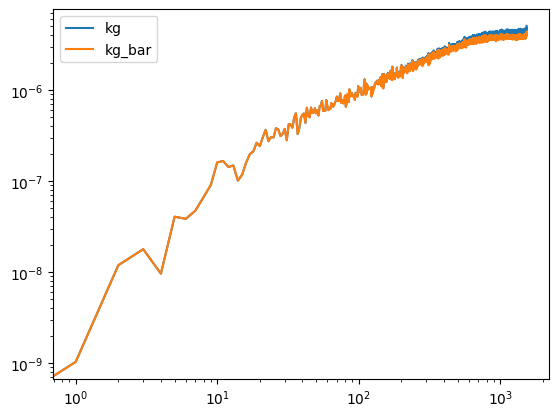

/tmp/ipykernel_3135382/477142453.py:11: RuntimeWarning: invalid value encountered in divide
  plt.loglog(cls_kg_scaled/cls_kg_bar_scaled - 1, label='kg/kb - 1')


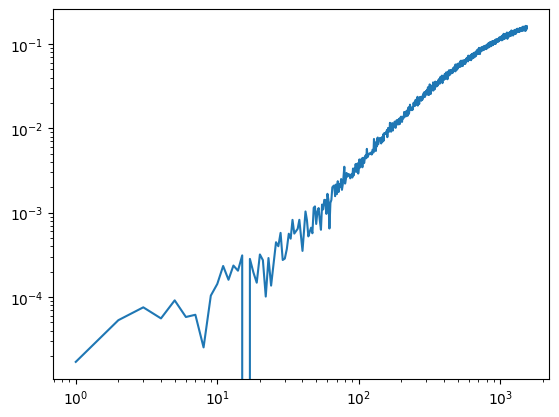

In [18]:
plt.loglog(*scale_cls(cls_kg), label='kg')
plt.loglog(*scale_cls(cls_kg_bar), label='kg_bar')
# plt.loglog(*scale_cls(cls_kg_smooth), label='kg_smooth')
# plt.loglog(*scale_cls(cls_kg_bar_smooth), label='kg_bar_smooth')
plt.legend()
plt.show()

_, cls_kg_scaled = scale_cls(cls_kg)
_, cls_kg_bar_scaled = scale_cls(cls_kg_bar)
# Plot the difference of the baryonic and non-baryonic cls
plt.loglog(cls_kg_scaled/cls_kg_bar_scaled - 1, label='kg/kb - 1')

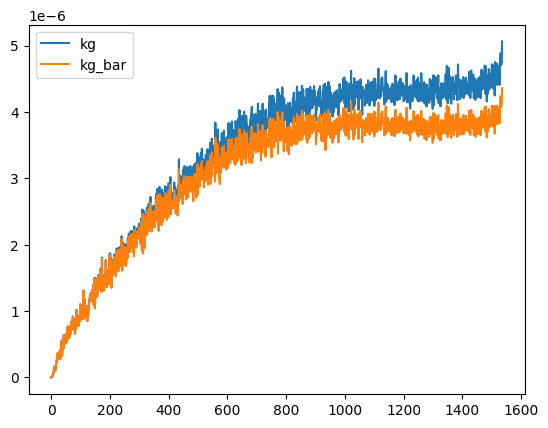

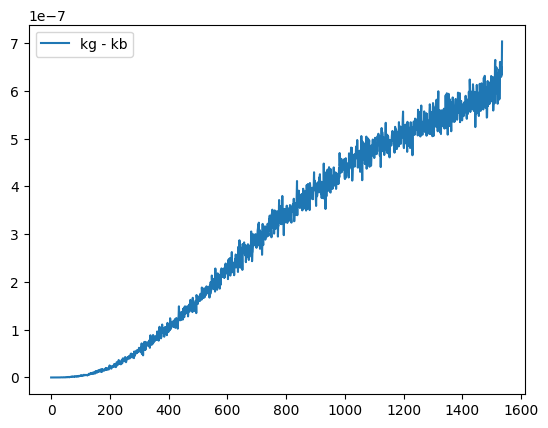

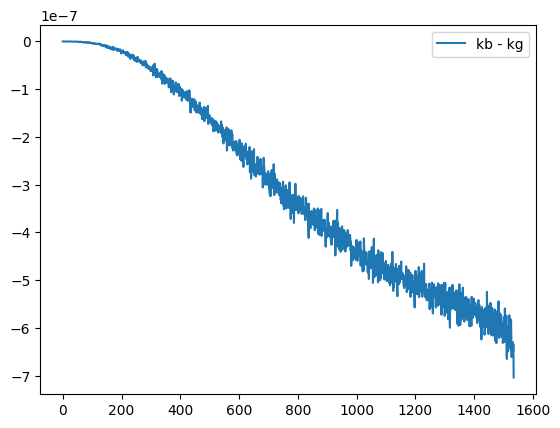

In [21]:
plt.plot(*scale_cls(cls_kg), label='kg')
plt.plot(*scale_cls(cls_kg_bar), label='kg_bar')
plt.legend()
plt.show()

plt.plot(cls_kg_scaled-cls_kg_bar_scaled, label='kg - kb')
plt.legend()
plt.show()

plt.plot(cls_kg_bar_scaled-cls_kg_scaled, label='kb - kg')
plt.legend()

# Analyze fiducial cosmologies to calculate covariance

In [22]:
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/fiducial/cosmo_fiducial/perm_0000/projected_probes_maps_nobaryons512.h5', 'r') as f:
    kg = np.array(f['kg/stage3_lensing1'])
    
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/fiducial/cosmo_fiducial/perm_0000/projected_probes_maps_baryonified512.h5', 'r') as f:
    kg_b = np.array(f['kg/stage3_lensing1'])

In [23]:
# Parameters
n_permutations = 200  # Number of permutations (0000 to 0199)
id_zbin = 0  # Redshift bin index, e.g., 0 for the first bin
smooth_arcmin = 0

In [116]:
# Store power spectra for all permutations
scaled_cls_list_kg = []

for perm_index in range(n_permutations):
    # Extract and process the kg map for the current permutation
    kg = get_bin_map(id_zbin, perm_index, with_baryons=False, smooth_arcmin=0)
    
    # Compute the power spectrum for the kg map
    cls_kg = hp.alm2cl(hp.map2alm(kg))
    
    # Scale the power spectrum
    _, scaled_cls_kg = scale_cls(cls_kg)
    
    # Store the scaled power spectrum
    scaled_cls_list_kg.append(scaled_cls_kg)
    
# Convert list of scaled Cls to a 2D numpy array (n_permutations x len(ells))
scaled_cls_array = np.array(scaled_cls_list_kg)

/tmp/ipykernel_3214835/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])


In [117]:
# # save the array to a file
# np.save('scaled_fid_cls_arrays_kg.npy', scaled_cls_array)

In [25]:
# load the array from a file
scaled_cls_array = np.load('scaled_fid_cls_arrays_kg.npy')

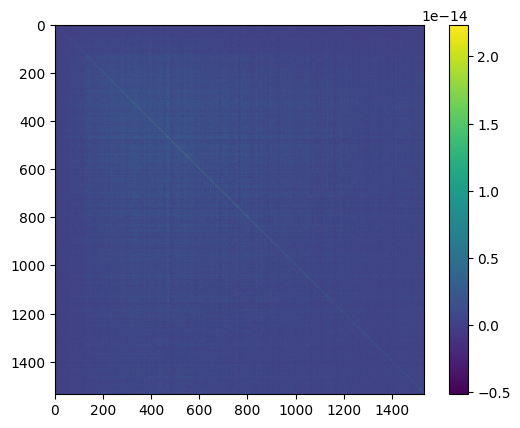

In [26]:
covariance_matrix = np.cov(scaled_cls_array, rowvar=False)

plt.imshow(covariance_matrix)
plt.colorbar()

In [120]:
# Store power spectra for all permutations
scaled_cls_list_kg_b = []

for perm_index in range(n_permutations):
    # Extract and process the kg map for the current permutation
    kg_b = get_bin_map(id_zbin, perm_index, with_baryons=True, smooth_arcmin=0)
    
    # Compute the power spectrum for the kg map
    cls_kg_b = hp.alm2cl(hp.map2alm(kg_b))
    
    # Scale the power spectrum
    _, scaled_cls_kg_b = scale_cls(cls_kg_b)
    
    # Store the scaled power spectrum
    scaled_cls_list_kg_b.append(scaled_cls_kg_b)
    
# Convert list of scaled Cls to a 2D numpy array (n_permutations x len(ells))
scaled_cls_array_b = np.array(scaled_cls_list_kg_b)

/tmp/ipykernel_3214835/2495378694.py:5: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments.
  kg = np.array(f[f'kg/stage3_lensing{id_zbin+1}'])


In [121]:
# # save the array to a file
# np.save('scaled_fid_cls_arrays_kg_b.npy', scaled_cls_array_b)

In [24]:
# load the array from a file
scaled_cls_array_b = np.load('scaled_fid_cls_arrays_kg_b.npy')

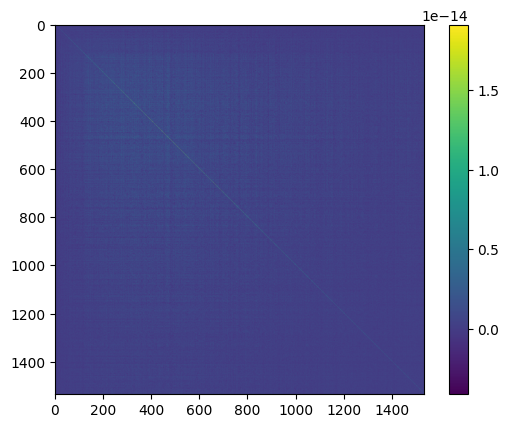

In [27]:
covariance_matrix_b = np.cov(scaled_cls_array_b, rowvar=False)
# save the covariance matrix to a file
np.save('cov_scaled_cls_fid_kg_b.npy', covariance_matrix_b)

plt.imshow(covariance_matrix_b)
plt.colorbar()

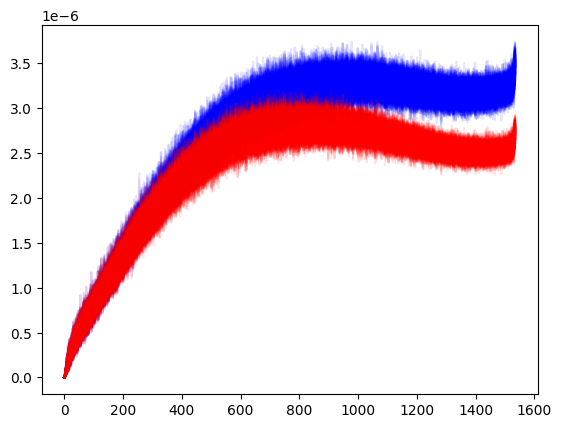

In [28]:
# plot all the scaled cls
for i in range(n_permutations):
    plt.plot(scaled_cls_array[i], alpha=0.1, color='blue')
for i in range(n_permutations):
    plt.plot(scaled_cls_array_b[i], alpha=0.1, color='red')

In [29]:
perm_index = 0
# Load the maps for both cases (with baryons and without baryons) -- (loading the 'perm_index'th permutation)
kg = get_bin_map(id_zbin, perm_index, with_baryons=False, smooth_arcmin=smooth_arcmin)  # Dark matter only
kg_b = get_bin_map(id_zbin, perm_index, with_baryons=True, smooth_arcmin=smooth_arcmin)  # With baryons

# Compute the power spectra
cls_kg = hp.alm2cl(hp.map2alm(kg))
cls_kg_b = hp.alm2cl(hp.map2alm(kg_b))

# Scale the power spectra
ells, scaled_cls_kg = scale_cls(cls_kg)
_, scaled_cls_kg_b = scale_cls(cls_kg_b)

# Calculate the fractional difference between the two power spectra
fractional_difference = (cls_kg_b - cls_kg) / cls_kg_b

# Calculate the fractional difference between the two scaled power spectra
fractional_difference_scaled = (scaled_cls_kg_b - scaled_cls_kg) / scaled_cls_kg_b

/tmp/ipykernel_3135382/2939700391.py:18: RuntimeWarning: invalid value encountered in divide
  fractional_difference_scaled = (scaled_cls_kg_b - scaled_cls_kg) / scaled_cls_kg_b


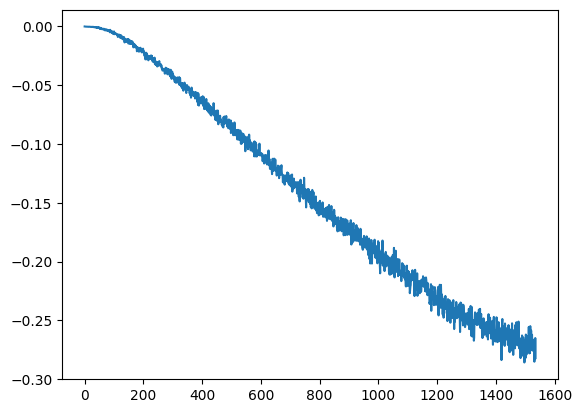

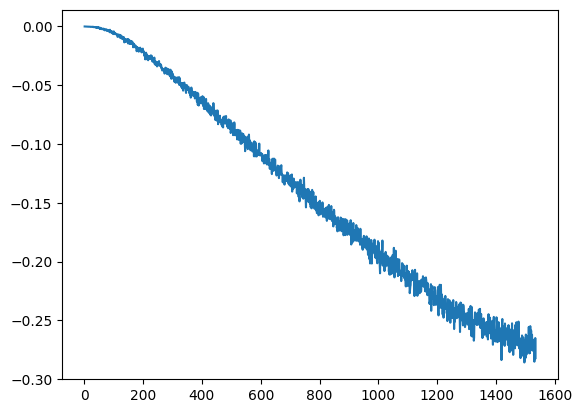

In [30]:
plt.plot(ells, fractional_difference)
plt.show()
plt.plot(ells, fractional_difference_scaled)
plt.show()

Approach 1: propagate the variance to the fractional difference analytically

In [61]:
var_kg = np.diag(covariance_matrix)
var_kg_b = np.diag(covariance_matrix_b)

In [62]:
# Propagate the errors to the fractional difference
fractional_difference_variance = var_kg / scaled_cls_kg_b**2 + (scaled_cls_kg**2 * var_kg_b) / scaled_cls_kg_b**4
fractional_difference_std = np.sqrt(fractional_difference_variance)

/tmp/ipykernel_472539/1543759900.py:2: RuntimeWarning: invalid value encountered in divide
  fractional_difference_variance = var_kg / scaled_cls_kg_b**2 + (scaled_cls_kg**2 * var_kg_b) / scaled_cls_kg_b**4


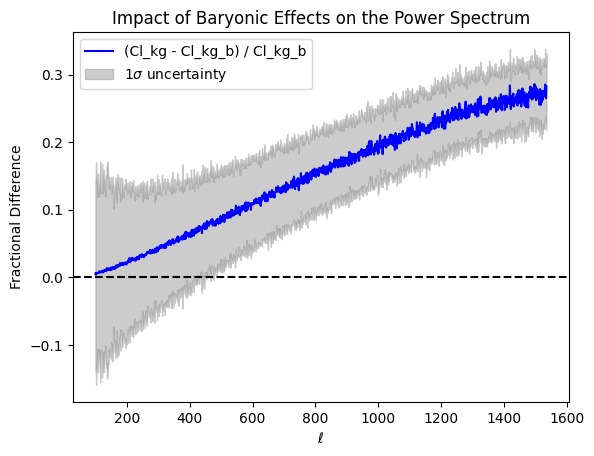

In [63]:
# Plot the fractional difference
plt.plot(ells[100:], fractional_difference[100:], label='(Cl_kg - Cl_kg_b) / Cl_kg_b', color='blue')

# Plot the propagated 1-sigma error band
plt.fill_between(ells[100:], fractional_difference[100:] - fractional_difference_std[100:], fractional_difference[100:] + fractional_difference_std[100:],
                 color='gray', alpha=0.4, label=r'1$\sigma$ uncertainty')

plt.axhline(0, color='black', linestyle='--')
plt.xlabel(r'$\ell$')
plt.ylabel('Fractional Difference')
plt.title('Impact of Baryonic Effects on the Power Spectrum')
plt.legend()

Approach 2: calculate the fractional difference for all realizations and then calculate the variance

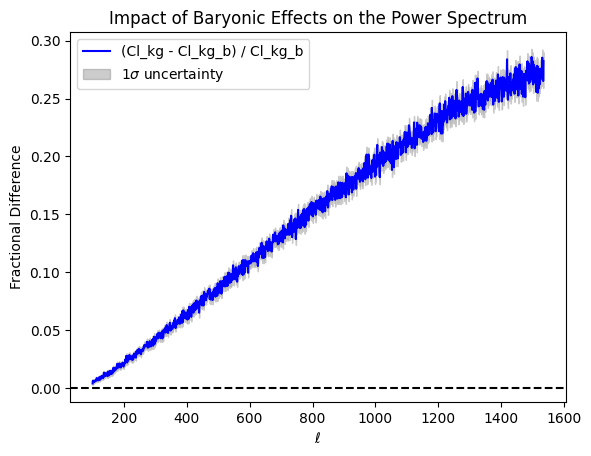

In [55]:
# Plot the fractional difference
plt.plot(ells[100:], fractional_difference[100:], label='(Cl_kg - Cl_kg_b) / Cl_kg_b', color='blue')

# Plot the propagated 1-sigma error band
plt.fill_between(ells[100:], fractional_difference[100:] - std_fractional_diff[100:], fractional_difference[100:] + std_fractional_diff[100:],
                 color='gray', alpha=0.4, label=r'1$\sigma$ uncertainty')

plt.axhline(0, color='black', linestyle='--')
plt.xlabel(r'$\ell$')
plt.ylabel('Fractional Difference')
plt.title('Impact of Baryonic Effects on the Power Spectrum')
plt.legend()

In [38]:
# Compute fractional differences for all realizations
fractional_differences = (scaled_cls_array - scaled_cls_array_b) / scaled_cls_array_b

/tmp/ipykernel_472539/3410169336.py:2: RuntimeWarning: invalid value encountered in divide
  fractional_differences = (scaled_cls_array - scaled_cls_array_b) / scaled_cls_array_b


In [52]:
# Variance of fractional differences at each multipole
variance_fractional_diff = np.var(fractional_differences, axis=0, ddof=1)
std_fractional_diff = np.sqrt(variance_fractional_diff)
# Covariance matrix of fractional differences across multipoles
covariance_fractional_diff = np.cov(fractional_differences, rowvar=False)

Approach 3*: Calculate the variance and covariance using all possible pairwise combinations between the two datasets

In [56]:
# Expand arrays for pairwise computation
scaled_cls_array_expanded = scaled_cls_array[:, None, :]  # Shape: (N, 1, M)
scaled_cls_array_b_expanded = scaled_cls_array_b[None, :, :]  # Shape: (1, N, M)

# Compute fractional differences for all pairs
fractional_differences = (
    (scaled_cls_array_expanded - scaled_cls_array_b_expanded) / scaled_cls_array_b_expanded
)  # Shape: (N, N, M)

# Flatten the first two dimensions into one
fractional_differences_flattened = fractional_differences.reshape(-1, fractional_differences.shape[-1])  # Shape: (N*N, M)

# Variance at each multipole
variance_fractional_diff = np.var(fractional_differences_flattened, axis=0, ddof=1)

# Covariance matrix across multipoles
covariance_fractional_diff = np.cov(fractional_differences_flattened, rowvar=False)

/tmp/ipykernel_472539/4036082855.py:7: RuntimeWarning: invalid value encountered in divide
  (scaled_cls_array_expanded - scaled_cls_array_b_expanded) / scaled_cls_array_b_expanded


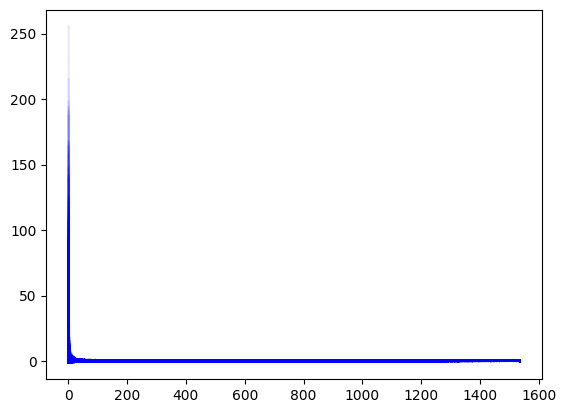

In [60]:
fractional_differences.shape

for i in range(n_permutations):
    for j in range(n_permutations):
        plt.plot(ells, fractional_differences[i, j], alpha=0.1, color='blue')

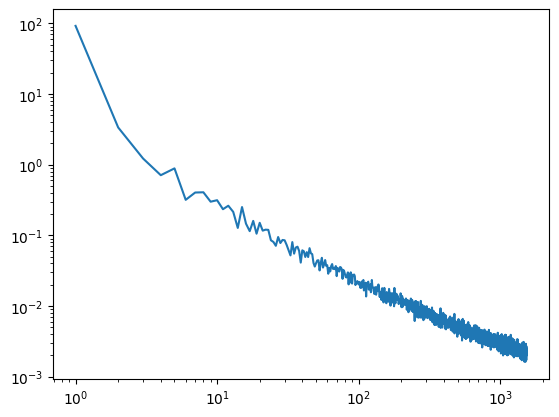

In [58]:
plt.loglog(ells, variance_fractional_diff)

# $\ell_1$-norm

In [7]:
import os
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import sys  

import pycs
from pycs.misc.cosmostat_init import *
from pycs.misc.mr_prog import *
from pycs.misc.im1d_tend import *
from pycs.misc.utilHSS import *
from pycs.misc.stats import *
from pycs.sparsity.mrs.mrs_tools import *

from sys import getsizeof

import pycs.sparsity.mrs
from pycs.sparsity.mrs.mrs_tools import *

## Wavelet transform on the sphere

In [8]:
import h5py
with h5py.File('/home/tersenov/CosmoGridV1/stage3_forecast/grid/cosmo_000002/perm_0000/projected_probes_maps_nobaryons512.h5', 'r') as f:
    kg = np.array(f['kg/stage3_lensing1'])

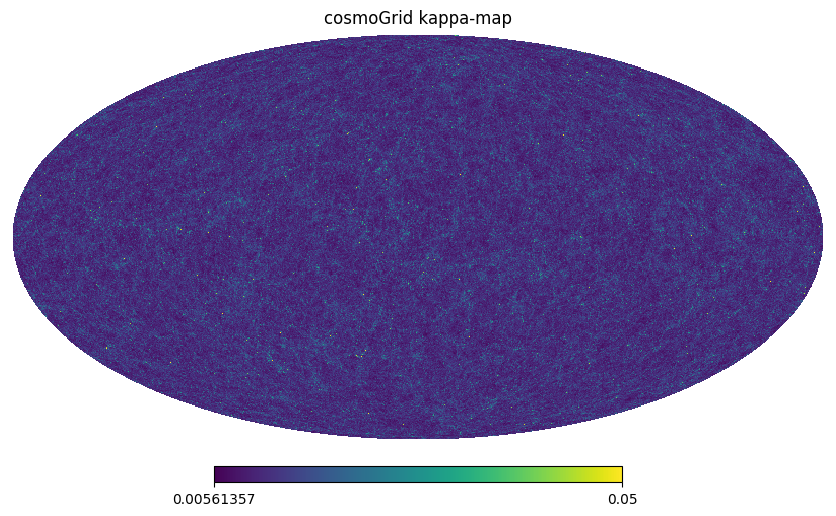

In [9]:
# Display the image.
inmap = kg
hp.mollview(inmap,max=0.05, title='cosmoGrid kappa-map')

In [10]:
ns = gnside(inmap) # get the nside of the map
print("Nside = ", ns) # print the nside
(ae,ab) = hp.map2alm_spin((inmap,inmap), 2) # compute the alm (alm = spherical harmonics coefficients) 
hxe= hp.alm2map(ae,ns,pol=False) # compute the map from the alm
he5= hp.smoothing(hxe, sigma=2./360. * (np.pi*2),pol=False) # smooth the map

Nside =  512


setting the output map dtype to [dtype('<f4')]


CMD =  mrs_uwttrans   -v  ./mr_temp_2025.01.14_14.47.39.fits ./mr_temp_2025.01.14_14.47.39_out.fits
# PARAMETERS: 
# File Name in = ./mr_temp_2025.01.14_14.47.39.fits
# File Name Out = ./mr_temp_2025.01.14_14.47.39_out.fits
Band 1, Norm = 0.831052
Band 2, Norm = 0.110593
Band 3, Norm = 0.0473452
Band 4, Norm = 0.0228206
Band 5, Norm = 0.0113435
Band 6, Norm = 0.00570194
Band 7, Norm = 0.00289302
Band 8, Norm = 0.00231174
Forward Transform
Lmax=1536
NbrScale = 8
BandLimit = 0


<Figure size 640x480 with 0 Axes>

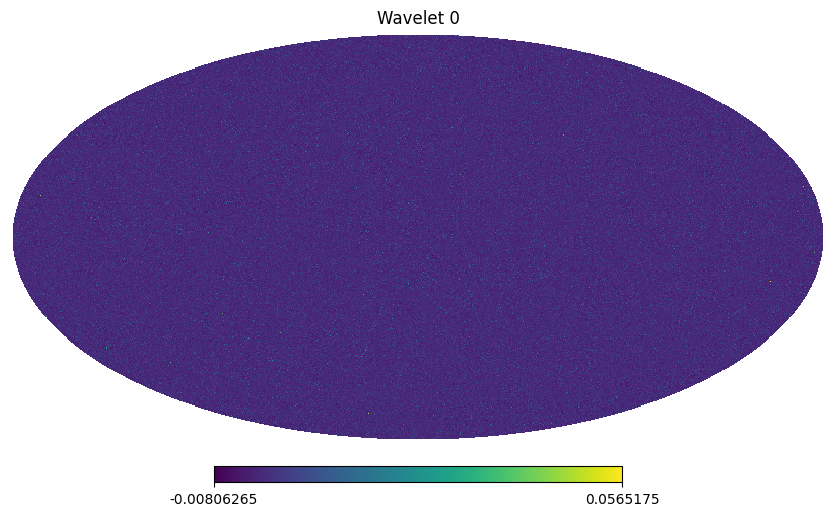

<Figure size 640x480 with 0 Axes>

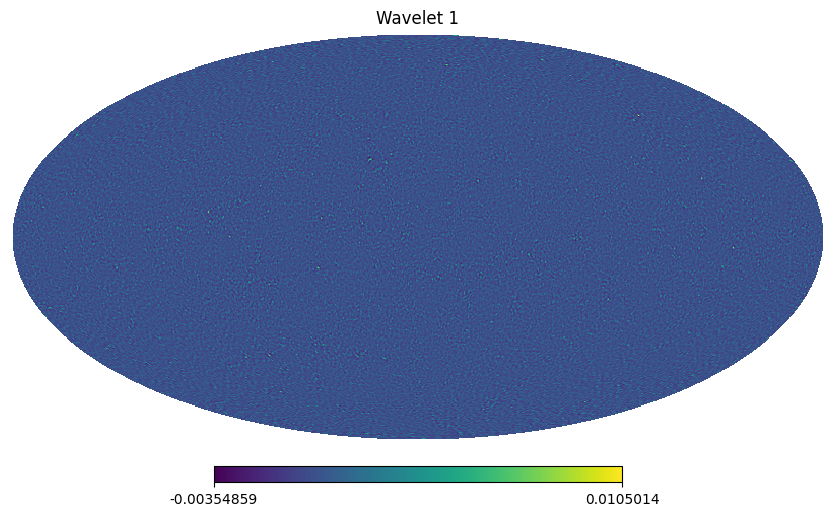

<Figure size 640x480 with 0 Axes>

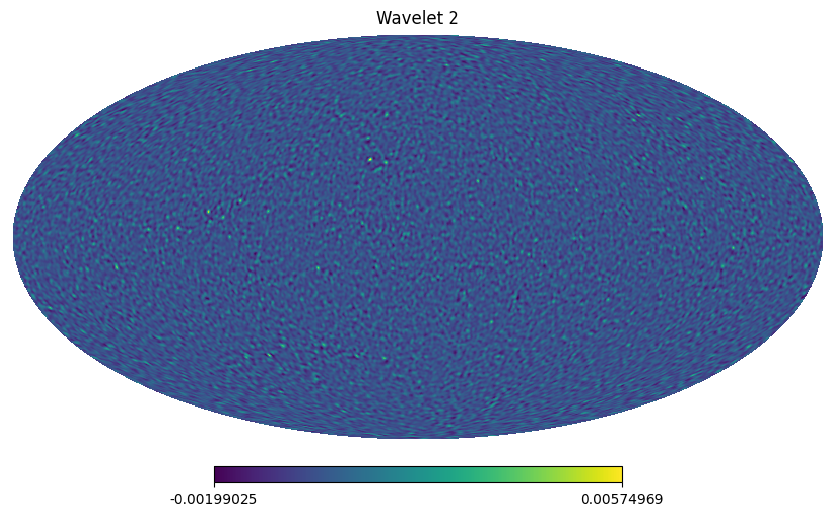

<Figure size 640x480 with 0 Axes>

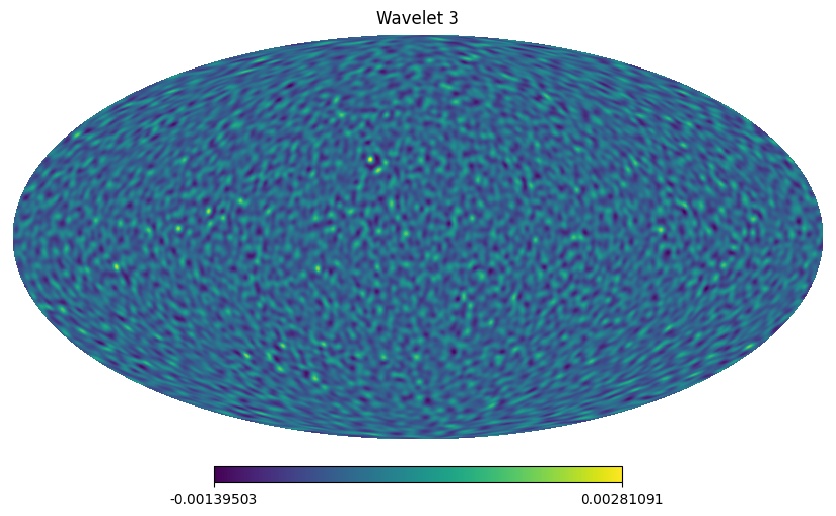

<Figure size 640x480 with 0 Axes>

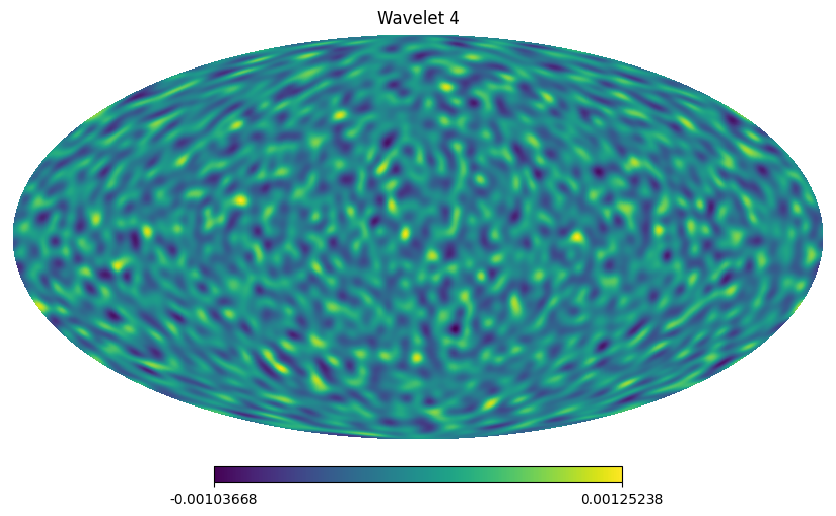

<Figure size 640x480 with 0 Axes>

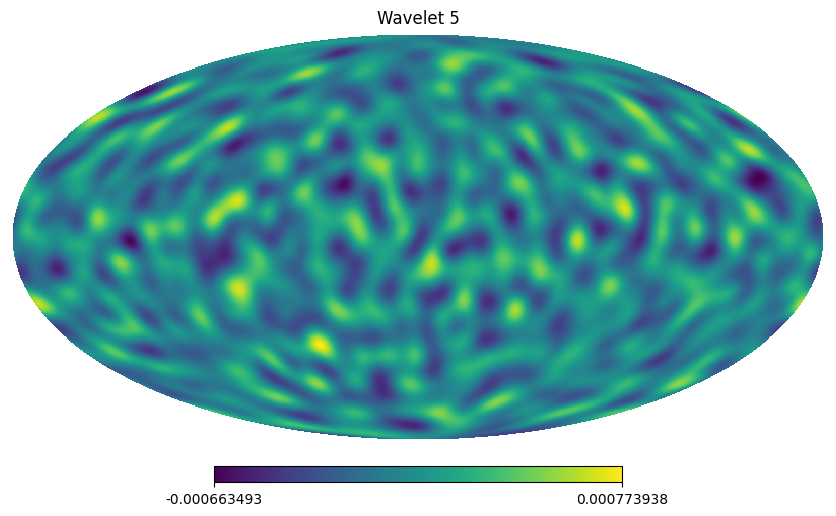

<Figure size 640x480 with 0 Axes>

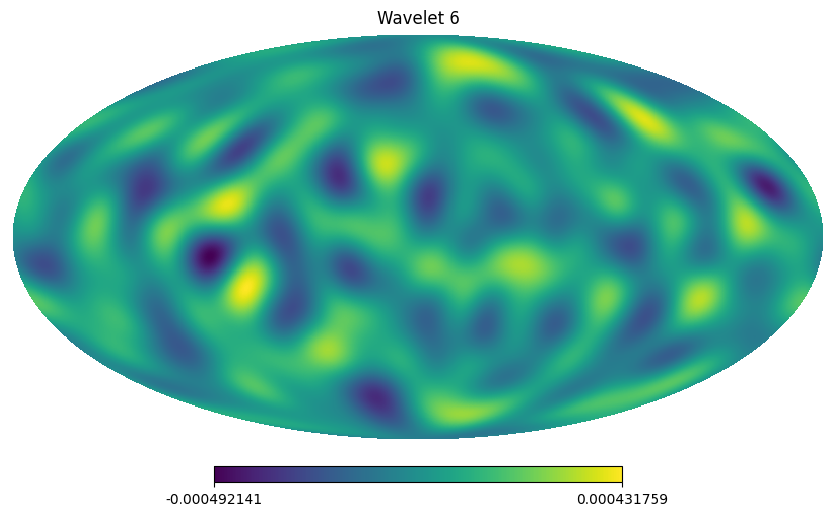

<Figure size 640x480 with 0 Axes>

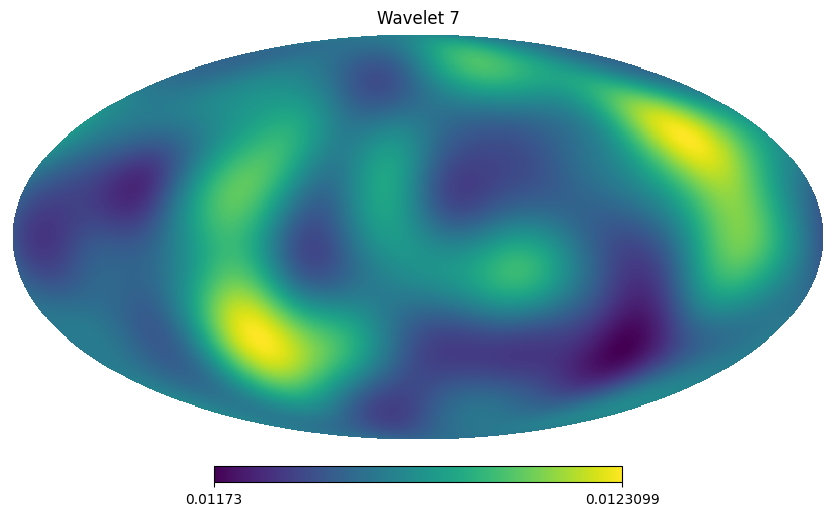

In [11]:
w = mrs_uwttrans(inmap, verbose=True) # compute the wavelet transform of the map
for filter_ in range(w.shape[0]):
    fig = plt.figure(filter_)
    hp.mollview(w[filter_, :], title=f'Wavelet {filter_}')
    plt.show()

In [12]:
l1norm_coll = []
bins_coll = []

nbins = 31

WT = mrs_uwttrans(inmap, verbose=True)

for i in range(WT.shape[0]):
    ScaleSNR = WT[i]
    
    min_snr_value = np.min(ScaleSNR)
    max_snr_value = np.max(ScaleSNR)
    
    thresholds_snr = np.linspace(min_snr_value, max_snr_value, nbins + 1)
    bins_snr = 0.5 * (thresholds_snr[:-1] + thresholds_snr[1:])
    
    # Digitize the SNR values into bins
    digitized = np.digitize(ScaleSNR, thresholds_snr)

    # Calculate the l1 norm for each bin
    bin_l1_norm = [
        np.sum(np.abs(ScaleSNR[digitized == j]))
        for j in range(1, len(thresholds_snr))
    ]

    # Store the bins and l1 norms for this scale
    bins_coll.append(bins_snr)
    l1norm_coll.append(bin_l1_norm)

setting the output map dtype to [dtype('<f4')]


CMD =  mrs_uwttrans   -v  ./mr_temp_2025.01.14_14.47.44.fits ./mr_temp_2025.01.14_14.47.44_out.fits
# PARAMETERS: 
# File Name in = ./mr_temp_2025.01.14_14.47.44.fits
# File Name Out = ./mr_temp_2025.01.14_14.47.44_out.fits
Band 1, Norm = 0.831052
Band 2, Norm = 0.110593
Band 3, Norm = 0.0473452
Band 4, Norm = 0.0228206
Band 5, Norm = 0.0113435
Band 6, Norm = 0.00570194
Band 7, Norm = 0.00289302
Band 8, Norm = 0.00231174
Forward Transform
Lmax=1536
NbrScale = 8
BandLimit = 0
